In [1]:
import json

import numpy as np
import pandas as pd
import pymongo
import scipy
from bson import ObjectId, json_util
from pandas.io.json import json_normalize
from pymongo import MongoClient as Connection
from scipy import sparse, spatial
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.metrics.pairwise import cosine_similarity

# scientific notation disabled form smaller numbers
pd.options.display.float_format = '{:.5f}'.format

# alles resultate anzeigen und nicht nur das letzte
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"



In [2]:
connection = Connection()
db = connection.recipe_db
input_data = db.recipes_without_reviews

data = json.loads(json_util.dumps(input_data.find()))

In [3]:
ing = pd.DataFrame(json_normalize(data, record_path='ingredients',
                             meta='id', record_prefix='ingredients_', errors='ignore'))


nutritions = pd.DataFrame(json_normalize(data, record_path='nutritions',
                            meta=['id', 'prep_time', 'rating', 'rating_count', 'ready_in_time', 'review_count']))


In [4]:
#  ------  erstellung und data cleansing - Ingredients

# schmeiss alle zutaten raus, die weniger als 5 mal verwendet werden
# setze multiinde auf 'id' und 'ingredients_id'
ingredients = ing.set_index(['id', 'ingredients_id'])

# filtere alle Zutaten samt ihrer rezepte id, die weniger gleich 5 mal vorkommen
ingredients_eqles_5_ing = ingredients.groupby(
    'ingredients_id').filter(lambda x: len(x) <= 5)

# droppe alle rezepte, die eine Zutate besitzen, die weniger gleich 5 Mal vorkommen
ingredients_filt = ingredients.drop(ingredients_eqles_5_ing.index.get_level_values('id').values, level=0)

# drop alls rows with ingredients_id == 0
ingredients_eqal_zero = ingredients_filt[ingredients_filt.index.get_level_values('ingredients_id') == 0]
ingredients_filt = ingredients_filt.drop(ingredients_eqal_zero.index.get_level_values('id').values, level=0)


In [5]:
#  ------ Erstellung und cleansing des Nutrition Dataframes

# erstelle neue liste auf basis der bereits gefilterten rezepte aus ingredients_filt
id_overlap_mask = nutritions['id'].isin(ingredients_filt.index.get_level_values('id').values)

# erstelle datenframe auf basis der overlapliste
nutritions_filt = nutritions.loc[id_overlap_mask]

nutrition_db = nutritions_filt.pivot_table(
    index=['id'],
    columns=['name'],
    values=['amount'],
).reset_index()

nutrition_db.set_index('id', inplace=True)

# remove multiindex 'amount'
nutrition_db.columns = nutrition_db.columns.droplevel(0)

# entferne alle NA
nutrition_db = nutrition_db.dropna()

# gleiche nochmals die ids der beiden dataframe nutrition und ingredients ab, da der nutrition dataframe noch NA Werte hatt
id_overlap_mask = ingredients_filt.index.get_level_values('id').isin(nutrition_db.index)
ingredients_db = ingredients_filt[id_overlap_mask]

# abgleich ob anzahl der indizes von nutrition und zutaten dataframe gleich sind


In [6]:
ingredients_db.reset_index(inplace=True)

recipe_db = pd.get_dummies(ingredients_db['ingredients_id']).groupby(
    ingredients_db['id']).apply(max)



In [7]:
new_ingredients = ingredients_db.copy()
#new_ingredients = new_ingredients.groupby("id")["ingredients_grams"].sum().reset_index()
gramms_ingredients = new_ingredients.groupby("id")["ingredients_grams"].sum().reset_index().copy()

Q1 = gramms_ingredients.quantile(0.25)
Q3 = gramms_ingredients.quantile(0.75)
IQR = Q3 - Q1

#Filter out all recipes which are outlier by their weight (gramms)
df = gramms_ingredients[~((gramms_ingredients < (Q1 - 1.5 * IQR)) |(gramms_ingredients > (Q3 + 1.5 * IQR))).any(axis=1)].copy()

#filter out recipes by weight which are not in the range 500 - 2373.59 gramms
df_start_at_fivehundret = df[df['ingredients_grams'].between(500, 2373.58225, inclusive=False)].copy()

df_start_at_fivehundret.set_index('id', inplace=True)
id_overlap_mask = nutritions['id'].isin(df_start_at_fivehundret.index.get_level_values('id').values)


# erstelle datenframe auf basis der overlapliste
nutritions_filt_gramm = nutritions.loc[id_overlap_mask]

nutrition_db2 = nutritions_filt_gramm.pivot_table(
    index=['id'],
    columns=['name'],
    values=['amount'],
).reset_index()

#create new nutrition db based on the above filtering
nutrition_db2.set_index('id', inplace=True)
nutrition_db2.columns = nutrition_db2.columns.droplevel(0)



In [8]:
# remove recipes which are missing in nutrition df from the ingredients tecipes dataframe
mask = recipe_db.index.isin(nutrition_db2.index.values)
recipe_db = recipe_db.loc[mask]


In [9]:
#top10 most common ingredients
#16421    2125 salt
#4342     1506 garlic
#4397     1412 onion
#16406    1185 ground black pepper
#16157    1016 butter
#6307      944 olive oil
#6494      786 skinless bone less chicken breast
#2496      749 water
#16238     574 grated Parmesan cheese
#16317     538 eggs
drop_id_list = [16421, 4342, 4397, 16406, 16157, 6307, 6494, 2496, 16238, 16317]


#filter out ingredients which are too common and the recipes in the user profile from the recipes database
recipe_db = recipe_db.drop(axis=1, labels=drop_id_list)


In [10]:
result_array = cdist(recipe_db, recipe_db,'jaccard')
distance_jacc = pd.DataFrame(result_array, columns=recipe_db.index.values, index=recipe_db.index.values)

In [12]:
ingredients_db_no_dupes = ingredients_db.drop_duplicates(subset=['ingredients_id'])

del ingredients_db_no_dupes['id']
del ingredients_db_no_dupes['ingredients_grams']
del ingredients_db_no_dupes['ingredients_type']

ingredients_db_no_dupes.set_index('ingredients_id', inplace=True)

ing_count = ingredients_db['ingredients_id'].value_counts()
ing_count = pd.DataFrame(ing_count) 
ing_count.rename(columns={ing_count.columns[0]:'ing_count'}, inplace=True)

ingredients_db_no_dupes = ingredients_db_no_dupes.join(ing_count)
ingredients_db_no_dupes = ingredients_db_no_dupes.sort_values('ing_count', ascending=False)

In [15]:
#from sklearn.cluster import DBSCAN
#db = DBSCAN(eps = 0.4, min_samples = 5, metric='precomputed' ).fit(distance_jacc) 
#labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
#n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_clusters_

6

In [16]:
#cluster_dbscan = db.labels_
#cluster_dbscan = pd.DataFrame(cluster_dbscan, index=recipe_db.index.values)
#cluster_dbscan.rename(columns={cluster_dbscan.columns[0]:'cluster'}, inplace=True)
#cluster_dbscan.groupby(['cluster']).size()

cluster
-1    3728
 0       5
 1      16
 2       5
 3       5
 4       6
 5       5
dtype: int64

In [19]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
  
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import normalize 
from sklearn.decomposition import PCA 


pca = PCA(n_components = 2) 
result_array = cdist(recipe_db, recipe_db,'jaccard')
X_principal = pca.fit_transform(result_array) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 



In [20]:

#db_default = DBSCAN(eps = 0.12, min_samples = 29).fit(X_principal) 
#labels = db_default.labels_ 

#n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_clusters_

5

In [21]:
#test1 = db_default.labels_
#test1 = pd.DataFrame(test1, index=recipe_db.index.values)
#test1.rename(columns={test1.columns[0]:'cluster'}, inplace=True)
#test1.groupby(['cluster']).size()

cluster
-1    1294
 0    2147
 1     196
 2      72
 3      36
 4      25
dtype: int64

<Figure size 648x648 with 0 Axes>

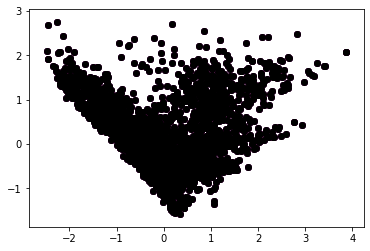

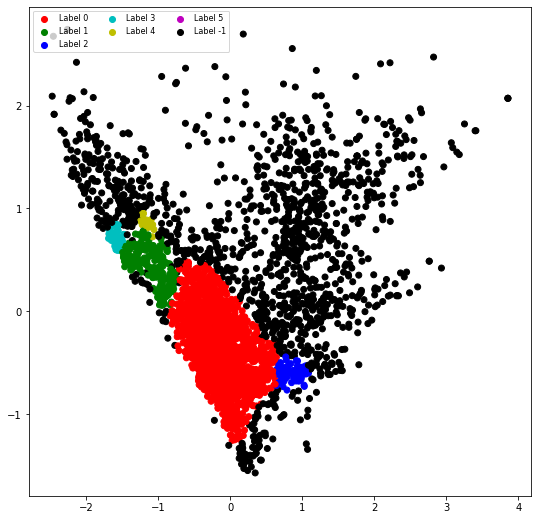

In [23]:
colours1 = {} 
colours1[0] = 'r'
colours1[1] = 'g'
colours1[2] = 'b'
colours1[3] = 'c'
colours1[4] = 'y'
colours1[5] = 'm'
colours1[-1] = 'k'

cvec = [colours1[label] for label in labels] 
colors = ['r', 'g', 'b', 'c', 'y', 'm', 'k' ] 

r = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[0]) 
g = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[1]) 
b = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[2]) 
c = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[3]) 
y = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[4]) 
m = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[5]) 
k = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[6]) 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((r, g, b, c, y, m, k), 
		('Label 0', 'Label 1', 'Label 2', 'Label 3', 'Label 4', 
			'Label 5', 'Label -1'), 
		scatterpoints = 1, 
		loc ='upper left', 
		ncol = 3, 
		fontsize = 8) 
plt.show() 


In [25]:

#db_default = DBSCAN(eps = 0.0375, min_samples = 20).fit(X_test) 
##labels = db_default.labels_ 

#n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_clusters_

NameError: name 'X_test' is not defined

In [26]:
#test1 = db_default.labels_
#test1 = pd.DataFrame(test1, index=recipe_db.index.values)
#test1.rename(columns={test1.columns[0]:'cluster'}, inplace=True)
#test1.groupby(['cluster']).size()

cluster
-1    1294
 0    2147
 1     196
 2      72
 3      36
 4      25
dtype: int64

In [27]:
colours1 = {} 
colours1[0] = 'r'
colours1[1] = 'g'
colours1[2] = 'b'
colours1[3] = 'c'
colours1[4] = 'y'
colours1[5] = 'm'
colours1[-1] = 'k'

cvec = [colours1[label] for label in labels] 
colors = ['r', 'g', 'b', 'c', 'y', 'm', 'k' ] 

r = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[0]) 
g = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[1]) 
b = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[2]) 
c = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[3]) 
y = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[4]) 
m = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[5]) 
k = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[6]) 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_test[:,0], X_test[:,1], c = cvec) 
plt.legend((r, g, b, c, y, m, k), 
		('Label 0', 'Label 1', 'Label 2', 'Label 3', 'Label 4', 
			'Label 5', 'Label -1'), 
		scatterpoints = 1, 
		loc ='upper left', 
		ncol = 3, 
		fontsize = 8) 
plt.show() 


NameError: name 'X_test' is not defined

Text(0.5, 1.0, 'Dendrogram')

Text(0.5, 0, 'Customers')

Text(0, 0.5, 'Euclidean distances')

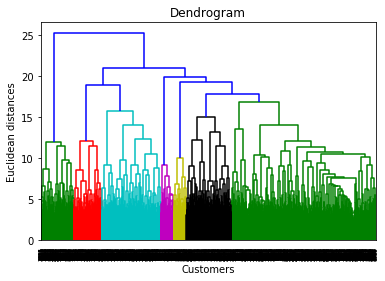

In [28]:
import scipy.cluster.hierarchy as sch

#Lets create a dendrogram variable linkage is actually the algorithm #itself of hierarchical clustering and then in linkage we have to #specify on which data we apply and engage. This is X dataset

#dendrogram = sch.dendrogram(sch.linkage(recipe_db, metric='euclidean', method  = "ward"))
#plt.title('Dendrogram')
#plt.xlabel('Customers')
#plt.ylabel('Euclidean distances')
#plt.show()

In [51]:
from sklearn.cluster import AgglomerativeClustering 
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')

hc.fit_predict(recipe_db)

labels = hc.labels_

array([1, 0, 1, ..., 0, 2, 0])

In [30]:
#from sklearn.cluster import AgglomerativeClustering 
#hc2 = AgglomerativeClustering(n_clusters = 5, affinity = 'precomputed', linkage ='complete')

#hc2.fit_predict(distance_jacc)

#labels = hc2.labels_

array([0, 0, 0, ..., 3, 2, 4])

In [31]:
y_hc2=hc.fit(recipe_db)

In [32]:
bla = y_hc2.labels_

In [35]:
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

5

In [52]:
test2 = labels
test2 = pd.DataFrame(test2, index=recipe_db.index.values)
test2.rename(columns={test2.columns[0]:'cluster'}, inplace=True)
test2.groupby(['cluster']).size()

cluster
0     980
1     375
2    2132
3     141
4     142
dtype: int64

In [53]:
test2[(test2['cluster'] == 1)].index.to_numpy()

array([  7198,   8494,   8539,   8545,   8590,   8614,   8639,   8667,
         8680,   8726,   8819,   8886,   8890,   8919,   8934,   8950,
         8991,   9009,   9021,   9023,   9025,   9051,   9231,   9252,
         9337,  11690,  11904,  12026,  12710,  12744,  12783,  12837,
        13199,  13861,  13974,  14001,  14044,  14495,  14502,  14521,
        14526,  14611,  14624,  14679,  14680,  14689,  14697,  14714,
        14740,  14758,  14759,  14840,  14951,  15005,  15224,  15646,
        15679,  15867,  16119,  16174,  16254,  16329,  16362,  16415,
        16449,  16683,  16862,  17092,  17325,  17511,  17619,  17749,
        17792,  17803,  17855,  17938,  17949,  18039,  18101,  18286,
        18340,  18837,  18874,  19509,  19929,  20040,  20095,  20415,
        20474,  20593,  20768,  20779,  21151,  21186,  21201,  21230,
        21561,  21700,  21815,  22219,  22297,  22299,  22331,  22340,
        22351,  23567,  23632,  23723,  23814,  24010,  24034,  24743,
      

In [38]:
test2[(test2['cluster'] == 0)].index.to_numpy()

array([  7198,   8493,   8494, ..., 255263, 255545, 255936])

In [40]:
from sklearn.manifold import MDS
result_array2 = cdist(recipe_db, recipe_db, 'euclidean')
distance_euclid = pd.DataFrame(result_array2, columns=recipe_db.index.values, index=recipe_db.index.values)




In [41]:
result_array2

array([[0.        , 3.46410162, 4.24264069, ..., 3.31662479, 3.74165739,
        3.74165739],
       [3.46410162, 0.        , 3.74165739, ..., 2.64575131, 2.82842712,
        3.46410162],
       [4.24264069, 3.74165739, 0.        , ..., 3.60555128, 3.74165739,
        4.24264069],
       ...,
       [3.31662479, 2.64575131, 3.60555128, ..., 0.        , 3.        ,
        3.31662479],
       [3.74165739, 2.82842712, 3.74165739, ..., 3.        , 0.        ,
        3.74165739],
       [3.74165739, 3.46410162, 4.24264069, ..., 3.31662479, 3.74165739,
        0.        ]])

In [42]:
#mds = MDS(n_components=2, dissimilarity='euclidean')
#X_test = mds.fit_transform(recipe_db)


In [43]:
X_test = mds.fit(distance_euclid)

/home/daniel/.pyenv/versions/3.7.4/lib/python3.7/site-packages/sklearn/manifold/_mds.py:419: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn("The MDS API has changed. ``fit`` now constructs an"


In [45]:
labels

array([0, 0, 0, ..., 3, 2, 4])

In [47]:

plt.figure(figsize =(10, 10)) 
plt.scatter(X_test[:,0],X_test[:,1], c=hc.labels_, cmap='Dark2')

<Figure size 720x720 with 0 Axes>

TypeError: 'MDS' object is not subscriptable

In [54]:
colours1 = {} 
colours1[0] = 'r'
colours1[1] = 'g'
colours1[2] = 'b'
colours1[3] = 'c'
colours1[4] = 'y'
colours1[5] = 'm'
colours1[6] = 'darkorange'
colours1[7] = 'crimson'
colours1[-1] = 'k'

cvec = [colours1[label] for label in labels] 
colors = ['r', 'g', 'b', 'c', 'y', 'm', 'k', 'darkorange', 'crimson' ] 

r = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[0]) 
g = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[1]) 
b = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[2]) 
c = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[3]) 
y = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[4]) 
m = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[5]) 
k = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[6]) 
do = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[7]) 
crim = plt.scatter( 
		X_test[:,0], X_test[:,1], marker ='o', color = colors[8]) 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_test[:,0], X_test[:,1], c = cvec) 
plt.legend((r, g, b, c, y, m, k, do, crim), 
		('Label 0', 'Label 1', 'Label 2', 'Label 3', 'Label 4', 
			'Label 5', 'Label -1', 'lable 6', 'label 7'), 
		scatterpoints = 1, 
		loc ='upper left', 
		ncol = 3, 
		fontsize = 8) 
plt.show() 

TypeError: 'MDS' object is not subscriptable

In [49]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
  
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import normalize 
from sklearn.decomposition import PCA 


pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(recipe_db) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 

Text(0.5, 1.0, 'Rezept-Cluster')

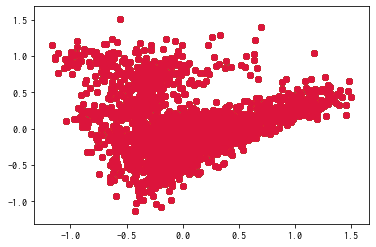

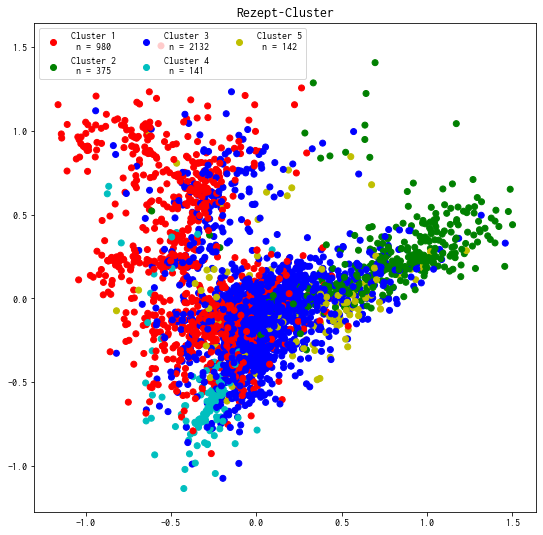

In [70]:
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline
from matplotlib import rcParams

rcParams['font.family'] = 'Inconsolata'


# figure related code



colours1 = {} 
colours1[0] = 'r'
colours1[1] = 'g'
colours1[2] = 'b'
colours1[3] = 'c'
colours1[4] = 'y'
colours1[5] = 'm'
colours1[6] = 'darkorange'
colours1[7] = 'crimson'
colours1[-1] = 'k'

cvec = [colours1[label] for label in labels] 
colors = ['r', 'g', 'b', 'c', 'y', 'm', 'k', 'darkorange', 'crimson' ] 

r = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[0]) 
g = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[1]) 
b = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[2]) 
c = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[3]) 
y = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[4]) 
m = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[5]) 
k = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[6]) 
do = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[7]) 
crim = plt.scatter( 
		X_principal['P1'], X_principal['P2'], marker ='o', color = colors[8]) 


fig = plt.figure(figsize =(9, 9))
ax = fig.add_subplot(111)
ax.set_title('Rezept-Cluster', fontsize=14)
#plt.suptitle('Rezeptgewicht Bereinigung', fontsize=14)
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((r, g, b, c, y, m, k, do, crim), 
		( 'Cluster 1\n n = 980', 'Cluster 2\n n = 375', 'Cluster 3\n n = 2132', 'Cluster 4\n n = 141 ', 
			'Cluster 5\n n = 142'), 
		scatterpoints = 1, 
		loc ='upper left', 
		ncol = 3, 
		fontsize = 10) 

plt.show() 
